In [1]:
import os
import cv2
import math
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
from PIL import Image, ImageDraw

In [2]:
df = pd.read_csv('../data/train_ship_segmentations_v2.csv')

In [3]:
image_folder = '../data/train_v2'

In [4]:
print(len(df))
print(df.head(5))

231723
         ImageId                                      EncodedPixels
0  00003e153.jpg                                                NaN
1  0001124c7.jpg                                                NaN
2  000155de5.jpg  264661 17 265429 33 266197 33 266965 33 267733...
3  000194a2d.jpg  360486 1 361252 4 362019 5 362785 8 363552 10 ...
4  000194a2d.jpg  51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...


Let's assume that same image has few annotations

In [5]:
merged_df = df.groupby('ImageId')['EncodedPixels'].apply(lambda x: x.tolist() if x.any() else np.nan).reset_index(name='annotations')


In [6]:
print(len(merged_df))
print(merged_df.head(5))

192556
         ImageId                                        annotations
0  00003e153.jpg                                                NaN
1  0001124c7.jpg                                                NaN
2  000155de5.jpg  [264661 17 265429 33 266197 33 266965 33 26773...
3  000194a2d.jpg  [360486 1 361252 4 362019 5 362785 8 363552 10...
4  0001b1832.jpg                                                NaN


In [7]:
merged_df['annotations'].isnull().sum()

150000

In [8]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 192556 entries, 0 to 192555
Data columns (total 2 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   ImageId      192556 non-null  object
 1   annotations  42556 non-null   object
dtypes: object(2)
memory usage: 2.9+ MB


In [9]:
merged_df['polygon_exists'] = merged_df['annotations'].notnull()
counts = merged_df['polygon_exists'].value_counts()
percentage = counts / len(merged_df) * 100

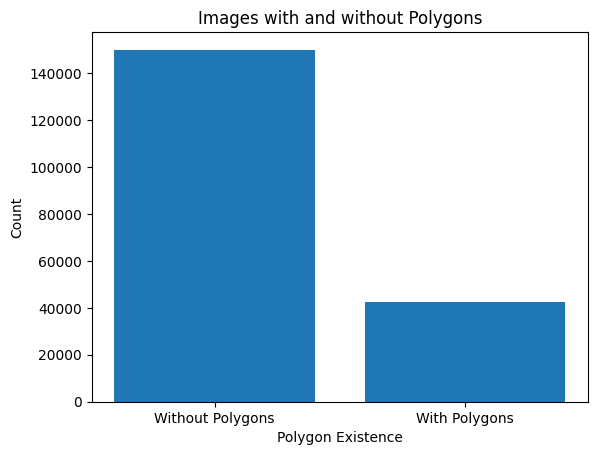

In [10]:
plt.bar(['Without Polygons','With Polygons'], counts)
plt.xlabel('Polygon Existence')
plt.ylabel('Count')
plt.title('Images with and without Polygons')
plt.show()

In [11]:
merged_df['num_objects'] = merged_df['annotations'].apply(lambda x: len(x) if isinstance(x, list) else np.nan)

In [12]:
merged_df

,ImageId,annotations,polygon_exists,num_objects
0,00003e153.jpg,NaN,False,NaN
1,0001124c7.jpg,NaN,False,NaN
2,000155de5.jpg,[264661 17 265429 33 266197 33 266965 33 26773...,True,1.0
3,000194a2d.jpg,[360486 1 361252 4 362019 5 362785 8 363552 10...,True,5.0
4,0001b1832.jpg,NaN,False,NaN
...,...,...,...,...
192551,fffedbb6b.jpg,NaN,False,NaN
192552,ffff2aa57.jpg,NaN,False,NaN
192553,ffff6e525.jpg,NaN,False,NaN
192554,ffffc50b4.jpg,NaN,False,NaN


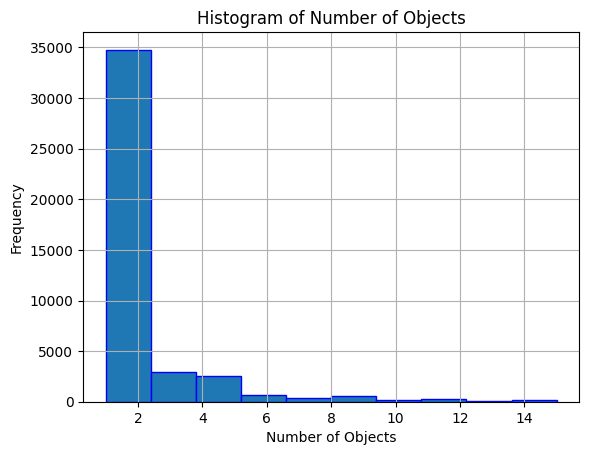

In [13]:
plt.hist(merged_df['num_objects'].dropna(), edgecolor='blue')
plt.xlabel('Number of Objects')
plt.ylabel('Frequency')
plt.title('Histogram of Number of Objects')
plt.grid(True)
plt.show()

In [60]:
def rle_to_pixels(rle_code):
    rle_code = [int(i) for i in rle_code.split()]
    pixels = [(pixel_position // 768, pixel_position % 768) 
              for start, length in list(zip(rle_code[0:-1:2], rle_code[1::2])) 
              for pixel_position in range(start, start + length)]
    return pixels

In [61]:
def apply_mask(image, mask):
    mask_image = Image.new('RGBA', image.size)
    draw = ImageDraw.Draw(mask_image)
    for x, y in mask:
        draw.point((x, y), fill=(255, 255, 0, 128))
    result = Image.alpha_composite(image.convert('RGBA'), mask_image)
    return result

In [62]:
def plot_images_with_labels(df, w, h, folder):
    df_with_labels = df[df['polygon_exists'] == True]

    selected_images = random.sample(df_with_labels['ImageId'].tolist(), w * h)

    fig, axes = plt.subplots(h, w, figsize=(16, 16))
    for i, ax in enumerate(axes.flat):
        ax.axis('off')
        image_name = selected_images[i]
        image_path = f'{folder}/{image_name}'
        image = Image.open(image_path)

        annotations = df.loc[df['ImageId'] == image_name, 'annotations'].values

        merged_mask = []

        for annotation in annotations:
            if isinstance(annotation, str):
                annotation = [annotation]
            for rle_mask in annotation:
                mask_pixels = rle_to_pixels(rle_mask)
                merged_mask.extend(mask_pixels)

        masked_image = apply_mask(image, merged_mask)
        ax.imshow(masked_image)
        ax.set_title('With Label')

    plt.tight_layout()
    plt.show()

In [63]:
def plot_images_without_labels(df, w, h, folder):
    df_without_labels = df[df['polygon_exists'] == False]

    selected_images = random.sample(df_without_labels['ImageId'].tolist(), w * h)

    fig, axes = plt.subplots(h, w, figsize=(16, 16))

    for i, ax in enumerate(axes.flat):
        ax.axis('off')
        image_name = selected_images[i]
        image_path = f'{folder}/{image_name}'
        image = Image.open(image_path)
        ax.imshow(image)
        ax.set_title('Without Label')

    plt.tight_layout()
    plt.show()

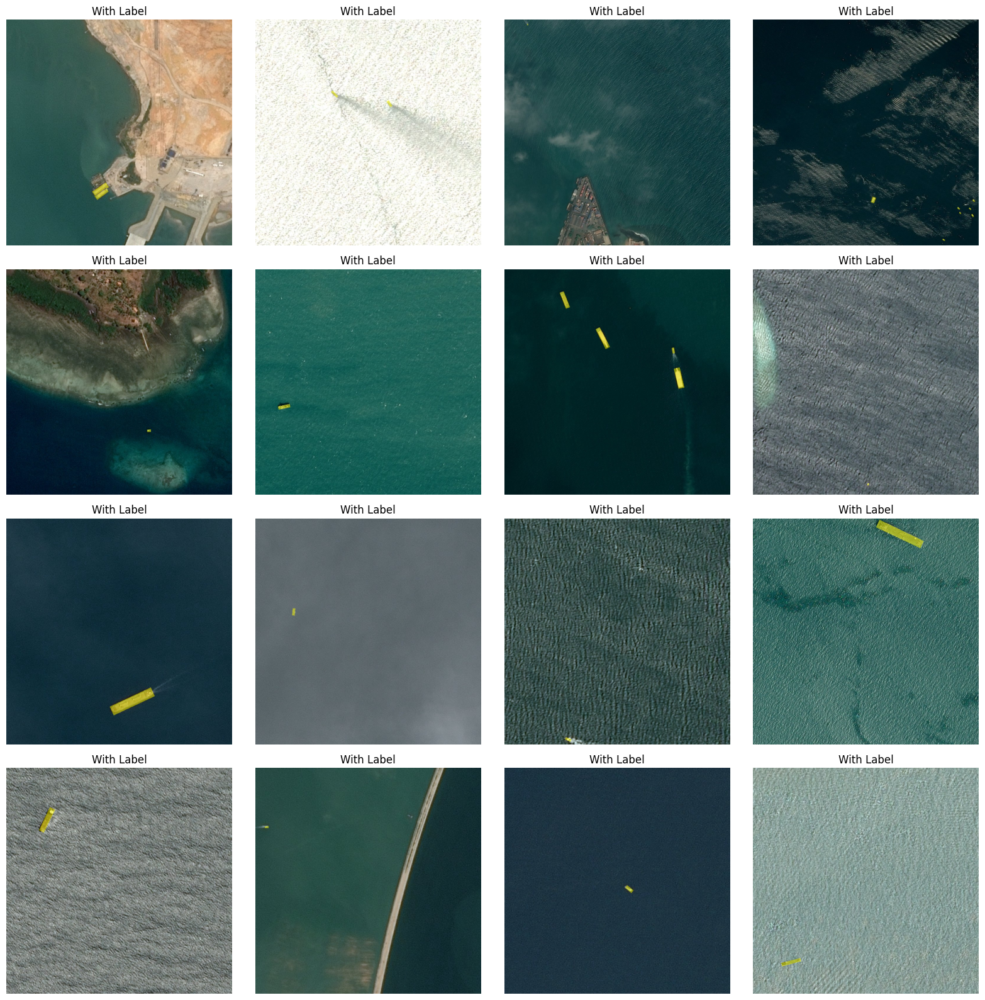

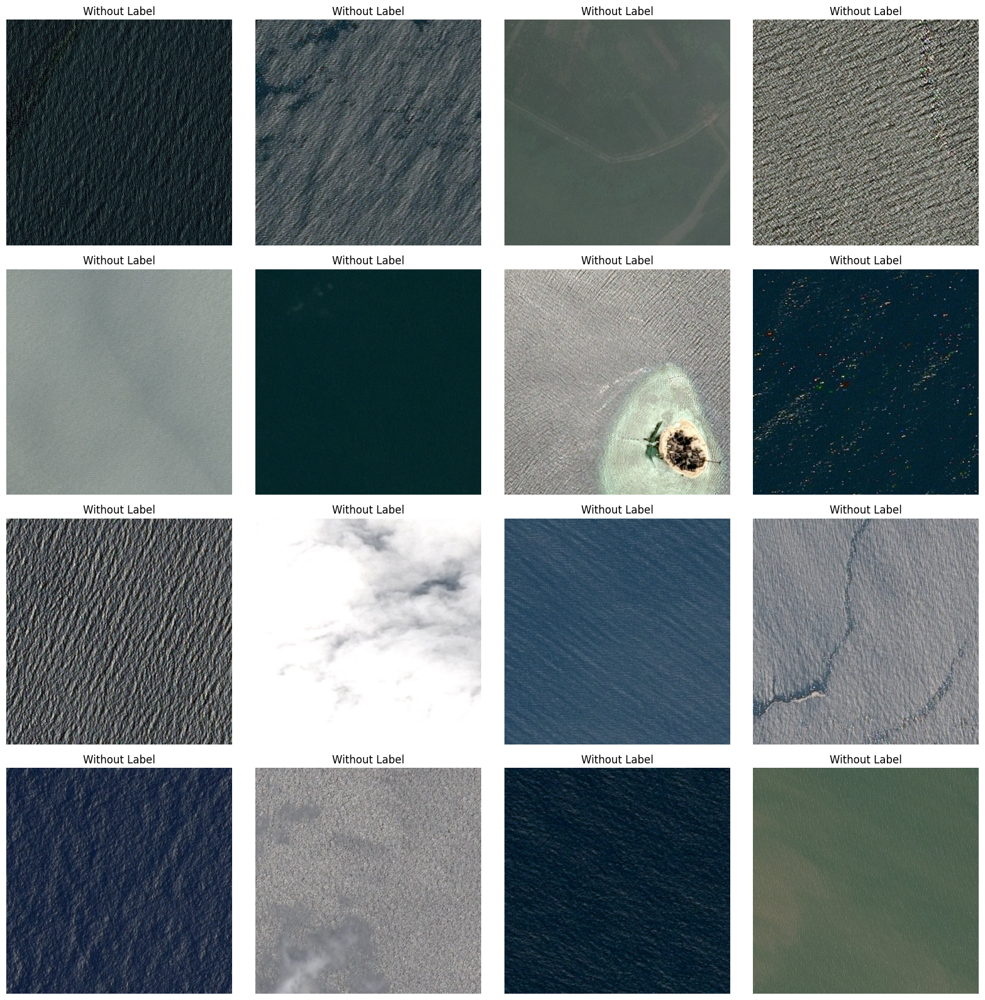

In [64]:
w = 4
h = 4

plot_images_with_labels(merged_df, w, h, image_folder)
plot_images_without_labels(merged_df, w, h, image_folder)

In [65]:
def check_image_existence(image_name):
    image_path = os.path.join(image_folder, image_name)
    return os.path.isfile(image_path)

In [66]:
missing_images = 0
for image_name in df['ImageId']:
    if not check_image_existence(image_name):
        missing_images += 1

In [67]:
print(f"Number of missing images: {missing_images}")

Number of missing images: 0


In [68]:
image_sizes = []

def get_image_size(image_name):
    image_path = os.path.join(image_folder, image_name)
    if os.path.isfile(image_path):
        image = Image.open(image_path)
        width, height = image.size
        image_sizes.append((width, height))

In [69]:
merged_df['ImageId'].apply(get_image_size)

most_common_sizes = Counter(image_sizes).most_common(5)
print("Most popular image sizes:")
for size, count in most_common_sizes:
    width, height = size
    print(f"Width: {width}px, Height: {height}px, Count: {count}")

Most popular image sizes:
Width: 768px, Height: 768px, Count: 192556


In [70]:
image_extensions = set()
for filename in os.listdir(image_folder):
    if os.path.isfile(os.path.join(image_folder, filename)):
        _, extension = os.path.splitext(filename)
        image_extensions.add(extension)

In [71]:
print("Image Extensions:")
for extension in image_extensions:
    print(extension)

Image Extensions:
.jpg


In [73]:
merged_df.to_parquet('../data/preprocessed/data.parquet')